# Ejercicios Unidad 1

1. Elija una de las imágenes color que tomó para la clase y aplique separación de canales y elija un método para transformarla en escala de grises. Muestre por pantalla los resultados obtenidos.



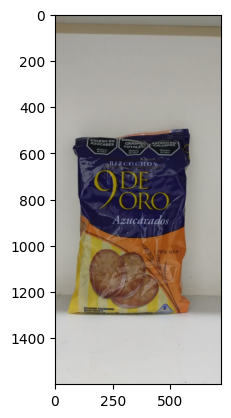

(<Figure size 640x480 with 1 Axes>,
 None)

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image   # Pillow --> https://pillow.readthedocs.io/en/stable/

imagen ='imagen1.jpeg'

# --- Imagen RGB ------------------------------------------------------------------------
img = cv2.imread(imagen)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(1), plt.imshow(img), plt.show(block=False)

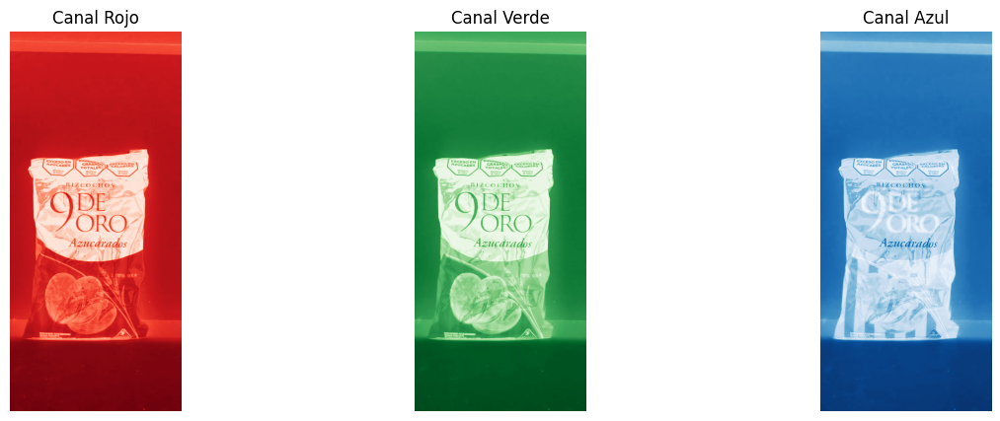

In [3]:
# Separar la imagen en los canales de color R, G, B
R, G, B = img[:,:,0], img[:,:,1], img[:,:,2]
# Paso 5: Mostrar cada canal de color
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(R, cmap='Reds')
axs[0].set_title('Canal Rojo')
axs[0].axis('off')

axs[1].imshow(G, cmap='Greens')
axs[1].set_title('Canal Verde')
axs[1].axis('off')

axs[2].imshow(B, cmap='Blues')
axs[2].set_title('Canal Azul')
axs[2].axis('off')

plt.show()

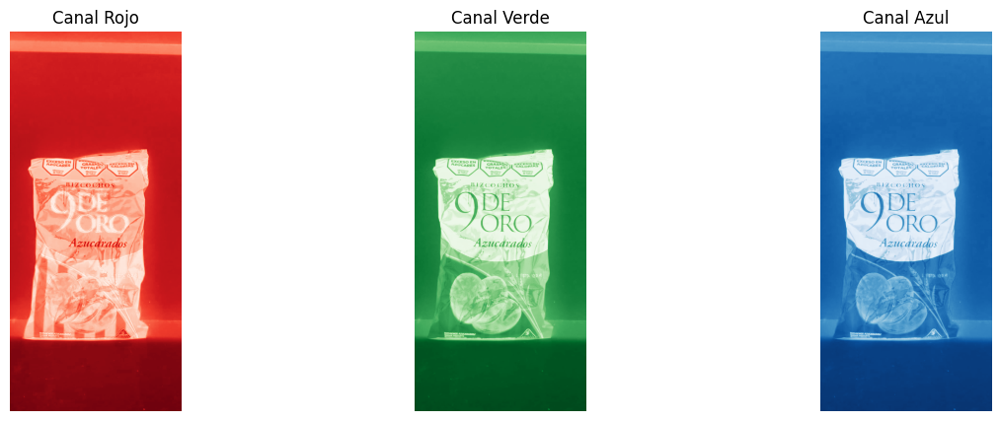

In [4]:
# --- Separar canales -------------------------------------------------------------------
B, G, R = cv2.split(img)
# Paso 5: Mostrar cada canal de color
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(R, cmap='Reds')
axs[0].set_title('Canal Rojo')
axs[0].axis('off')

axs[1].imshow(G, cmap='Greens')
axs[1].set_title('Canal Verde')
axs[1].axis('off')

axs[2].imshow(B, cmap='Blues')
axs[2].set_title('Canal Azul')
axs[2].axis('off')

plt.show()

Shape de la imagen original (RGB): (1600, 720, 3)
Tipo de dato del array de la imagen original: uint8
Shape de la imagen en escala de grises: (1600, 720)
Tipo de dato del array de la imagen en escala de grises: uint8


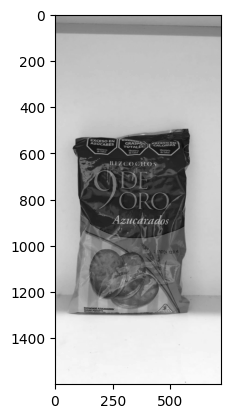

In [5]:
#gray=cv2.imread('/content/WhatsApp Image 2024-03-21 at 14.05.19.jpeg', cv2.IMREAD_GRAYSCALE)
# Convertir la imagen a escala de grises
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Imprimir el shape y el tipo de dato del array de la imagen original y en escala de grises
print(f"Shape de la imagen original (RGB): {img.shape}")
print(f"Tipo de dato del array de la imagen original: {img.dtype}")
print(f"Shape de la imagen en escala de grises: {gray.shape}")
print(f"Tipo de dato del array de la imagen en escala de grises: {gray.dtype}")

plt.imshow(gray,cmap='gray')

2. Con las fotografías pedidas por la cátedra la clase pasada (la foto de objetos con fondo liso, y fotos del mismo producto en un contexto más complejo) usar los métodos de extracción de características (esos anteriores al Deep Learning) para encontrar la ubicación del producto dentro de la imagen.

In [6]:
import cv2 as cv

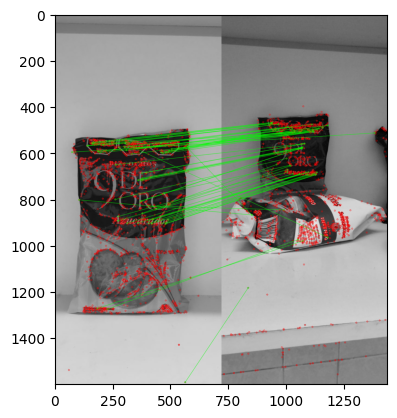

(<matplotlib.image.AxesImage at 0x7b4b190b3cd0>, None)

In [7]:
# Cargar imágenes en escala de grises
img1 = cv.imread('/content/imagen1.jpeg', cv.IMREAD_GRAYSCALE)          # Imagen de consulta (queryImage)
img2 = cv.imread('/content/imagen2.jpeg', cv.IMREAD_GRAYSCALE) # Imagen de entrenamiento (trainImage)

# Iniciar el detector SIFT
sift = cv.SIFT_create()

# Encontrar los keypoints y descriptores con SIFT
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# Parámetros FLANN
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)  # o pasar un diccionario vacío

# Iniciar FLANN matcher
flann = cv.FlannBasedMatcher(index_params, search_params)

# Realizar emparejamientos kNN
matches = flann.knnMatch(des1, des2, k=2)

# Necesitamos dibujar solo los buenos emparejamientos, por lo que creamos una máscara
matchesMask = [[0, 0] for i in range(len(matches))]

# Test de proporción según el artículo de Lowe (https://www.robots.ox.ac.uk/~vgg/research/affine/det_eval_files/lowe_ijcv2004.pdf)
for i, (m, n) in enumerate(matches):
    if m.distance < 0.7 * n.distance:
        matchesMask[i] = [1, 0]

# Parámetros de dibujo para los emparejamientos
draw_params = dict(matchColor=(0, 255, 0),  # color de los emparejamientos
                   singlePointColor=(255, 0, 0),  # color de los puntos individuales
                   matchesMask=matchesMask,  # máscara para seleccionar emparejamientos
                   flags=cv.DrawMatchesFlags_DEFAULT)

# Dibujar los emparejamientos kNN
img3 = cv.drawMatchesKnn(img1, kp1, img2, kp2, matches, None, **draw_params)

# Mostrar la imagen resultante
plt.imshow(img3), plt.show()

    
4. Con los videos de [youtube.com](http://youtube.com) de cámara fija pedidos para esta clase, aplicar los algoritmos de detección de movimiento vistos en la teoría.


In [8]:
%%capture
# Instalar la biblioteca pytube
!pip install pytube
!apt update && apt install -y handbrake

from pytube import YouTube

# URL del video de YouTube
url = 'https://www.youtube.com/watch?v=8s5P2nZNJpw'

# Crear un objeto YouTube
yt = YouTube(url)

# Seleccionar el stream con resolución de 720p
video = yt.streams.filter(progressive=True, file_extension='mp4', res="720p").first()

# Nombre del archivo de salida
output_filename = 'highway.mp4'

# Descargar el video con el nombre especificado
video.download(filename=output_filename)

print("Descarga completada.")

In [9]:
#Esto convierte el video a un formato más liviano de trabajo
#!ffmpeg -y -i '/content/Catar 2022 - Argentina vs Francia - Gol Di Maria - Cámara Táctica.mp4' -vf "scale=600:-1" -an -t 30 highway_600.mp4
!ffmpeg -y -i '/content/highway.mp4' -vf "scale=600:-1" -an -t 30 highway_600.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [10]:
from google.colab.patches import cv2_imshow

In [11]:
#video_path = '/content/Catar 2022 - Argentina vs Francia - Gol Di Maria - Cámara Táctica.mp4'  '/content/highway.mp4'
video_path = '/content/highway_600.mp4'

In [12]:
# Función actualizada para realizar diferencia de fotogramas con normalización:
def process_frame_difference(new_image, prev_image, **kwargs):
    # Convertir las imágenes a escala de grises
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY)
    prev_gray = cv2.cvtColor(prev_image, cv2.COLOR_RGB2GRAY)

    # Calcular la diferencia absoluta entre los fotogramas actual y anterior
    frame_diff = cv2.absdiff(new_gray, prev_gray)

    # Normalizar la imagen de diferencia
    norm_diff = cv2.normalize(frame_diff, None, 0, 255, cv2.NORM_MINMAX)

    # Umbralizar la imagen para resaltar las diferencias
    _, thresh = cv2.threshold(norm_diff, 100, 255, cv2.THRESH_BINARY)

    # Convertir la imagen umbralizada a color para mantener la consistencia con el video original
    thresh_color = cv2.cvtColor(thresh, cv2.COLOR_GRAY2RGB)

    return thresh_color

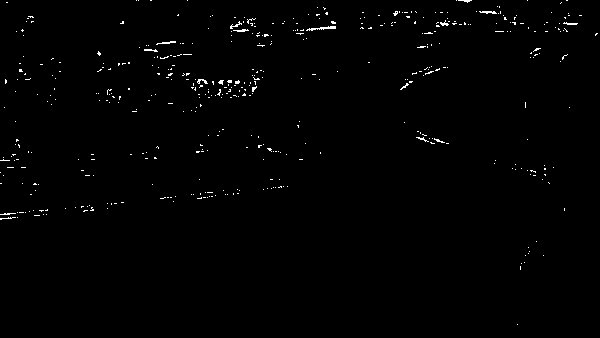

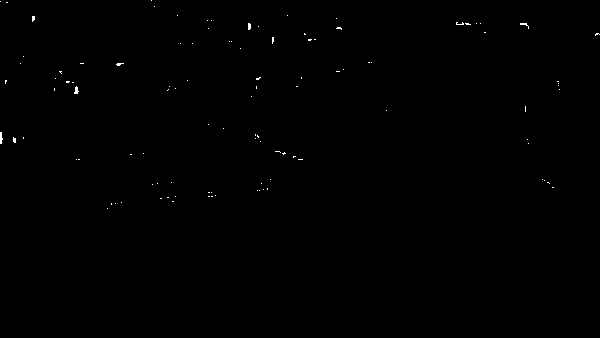

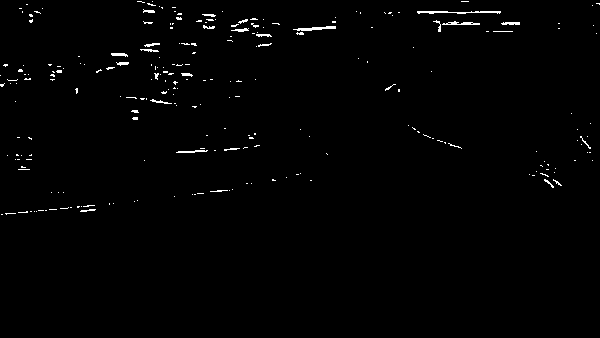

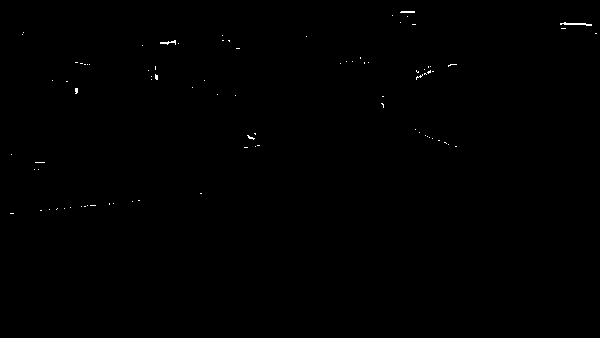

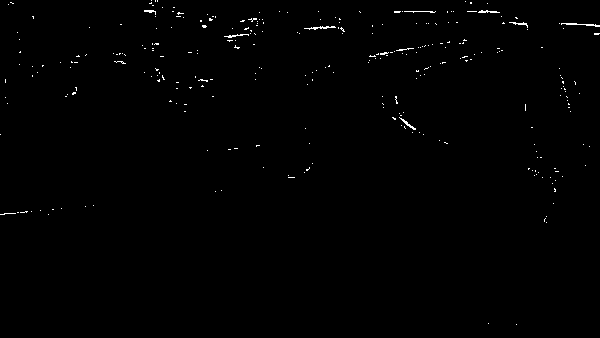

...

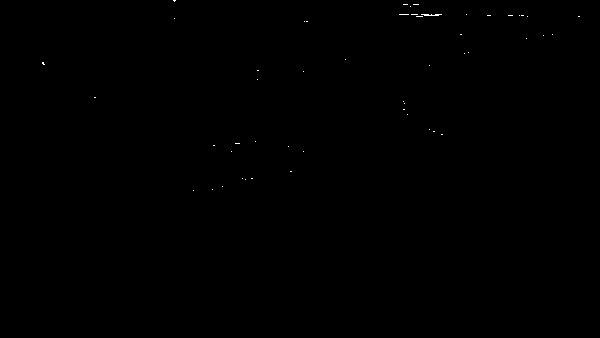

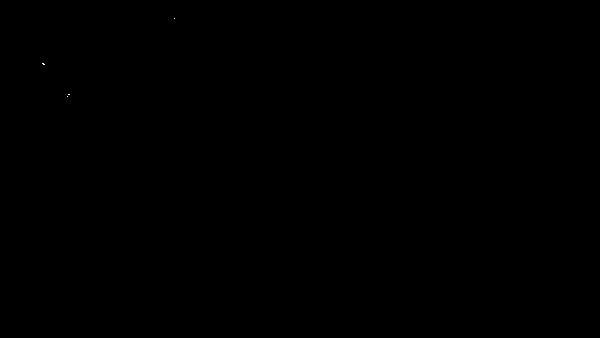

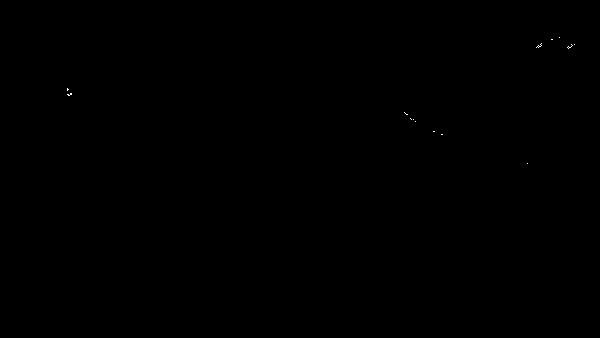

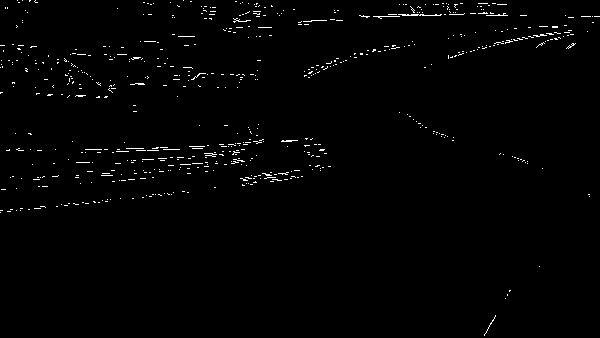

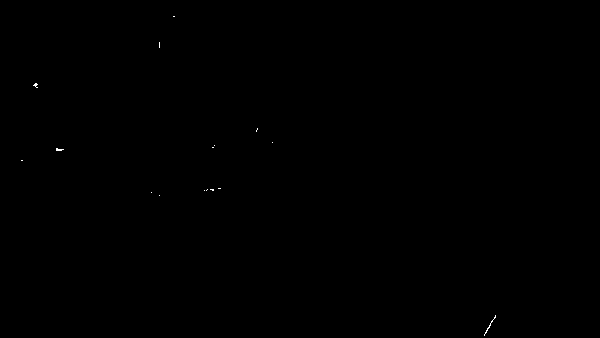

In [13]:
# Crear un objeto de captura de video
cap = cv2.VideoCapture(video_path)

# Leer el primer fotograma
ret, prev_frame = cap.read()

# Iterar sobre los fotogramas restantes del video
while cap.isOpened():
    # Leer el siguiente fotograma
    ret, new_frame = cap.read()

    # Verificar si la lectura del fotograma fue exitosa
    if not ret:
        break

    # Procesar el fotograma actual con respecto al anterior
    processed_frame = process_frame_difference(new_frame, prev_frame)

    # Mostrar el fotograma procesado
    cv2_imshow(processed_frame)

    # Mostrar el fotograma original
    #cv2_imshow(new_frame)

    # Guardar el fotograma actual para usarlo como fotograma anterior en la siguiente iteración
    prev_frame = new_frame

    # Esperar 30 milisegundos. Si se presiona la tecla 'q', salir del bucle
    if cv2.waitKey(30) & 0xFF == ord('q'):
        break

# Liberar el objeto de captura y cerrar todas las ventanas
cap.release()
cv2.destroyAllWindows()

In [14]:
!pip install mediapy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 8.7 MB/s eta 0:00:00


In [40]:
import mediapy as media  # Importar la biblioteca mediapy para manejo de medios
import cv2  # Importar OpenCV para el procesamiento de imágenes y videos
import numpy as np


# Función para oscurecer una imagen:
def process_image(new_image, prev_image, **kwargs):
    # Convertir la imagen a float32
    new_image_float = new_image.astype(np.float32)

    # Reducir el brillo de la imagen a la mitad
    new_image_float *= 0.7

    # Convertir la imagen de vuelta a uint8
    new_image_uint8 = np.clip(new_image_float, 0, 255).astype(np.uint8)

    return new_image_uint8

def draw_contours(frame, contours, color=(0, 255, 0), thickness=2):
    # Comprobar si la imagen es en escala de grises (1 canal)
    if len(frame.shape) == 2 or frame.shape[2] == 1:
        # Convertir la imagen de escala de grises a color (3 canales)
        result_image = cv2.cvtColor(frame, cv2.COLOR_GRAY2BGR)
    else:
        # Si ya es una imagen de color, simplemente hacer una copia
        result_image = frame.copy()

    # Dibujar cada contorno en la imagen
    for contour in contours:
        # Obtener el rectángulo delimitador para cada contorno
        x, y, w, h = cv2.boundingRect(contour)
        # Dibujar el rectángulo
        cv2.rectangle(result_image, (x, y), (x + w, y + h), color, thickness)

    return result_image

# Función para procesar un video:
def video_processor(filename_in, filename_out, process_func, max_time=10, **kwargs):
    # Abrir el video de entrada para lectura
    with media.VideoReader(filename_in) as r:
        # Crear un archivo de video de salida
        with media.VideoWriter(filename_out, shape=r.shape, fps=r.fps, bps=r.bps) as w:
            count = 0  # Inicializar contador de fotogramas
            prev_image = None  # Inicializar la imagen previa

            # Iterar sobre cada imagen (fotograma) del video
            for image in r:
                new_image = media.to_uint8(image)  # Convertir la imagen a formato flotante

                # Comprobar si es la primera imagen
                if prev_image is None:
                    prev_image = new_image.copy()

                # Procesar la imagen utilizando la función dada
                processed_image = process_func(new_image, prev_image, **kwargs)

                # Añadir la imagen procesada al video de salida
                w.add_image(processed_image)

                # Actualizar la imagen previa
                prev_image = new_image.copy()

                # Incrementar el contador de fotogramas
                count += 1

                # Detener el proceso si se alcanza el tiempo máximo
                if count >= max_time * r.fps:
                    break

# Función actualizada para realizar diferencia de fotogramas con normalización:
def process_frame_difference(new_image, prev_image, **kwargs):
    # Convertir las imágenes a escala de grises
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY)
    prev_gray = cv2.cvtColor(prev_image, cv2.COLOR_RGB2GRAY)

    # Calcular la diferencia absoluta entre los fotogramas actual y anterior
    frame_diff = cv2.absdiff(new_gray, prev_gray)

    # Normalizar la imagen de diferencia
    norm_diff = cv2.normalize(frame_diff, None, 0, 255, cv2.NORM_MINMAX)

    # Umbralizar la imagen para resaltar las diferencias
    _, thresh = cv2.threshold(norm_diff, 100, 200, cv2.THRESH_BINARY)

    # Convertir la imagen umbralizada a color para mantener la consistencia con el video original
    thresh_color = cv2.cvtColor(thresh, cv2.COLOR_GRAY2RGB)

    return thresh_color


In [38]:
# Nombres de los archivos de video de entrada y salida
filename_in = 'highway_600.mp4'
filename_out = 'highway_dark.mp4'

# Llamar a la función para procesar el video
video_processor(filename_in, filename_out, process_image, 10)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=30)

In [42]:
deteccion = 'deteccion1.mp4'

# Llamar a la función para procesar el video
video_processor(filename_out, deteccion, process_frame_difference, 10)

# Mostrar el video resultante
media.show_video(media.read_video(deteccion), fps=30)

5. Genere un video en un patio o en un hall de edificio donde en un principio se vea vacío y luego aparezca una persona. Mediante los métodos de motion detection (sin usar deep learning) logre una detección de la persona cuando entra al cuadro suponiendo la utilidad para una cámara de seguridad.
Luego sobre el mismo video aplique los algoritmos de flujo denso y disperso que se mostraron en clase.
Escriba una reflexión sobre los resultados en el formato md dentro del Jupyter Notebook.

In [43]:
# Nombres de los archivos de video de entrada y salida
filename_in = 'ejercicio5.mp4'
filename_out = '5-dark.mp4'

# Llamar a la función para procesar el video
video_processor(filename_in, filename_out, process_image, 10)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=30)

In [32]:
deteccion = 'deteccion.mp4'

In [33]:
# Llamar a la función para procesar el video
video_processor(filename_out, deteccion, process_frame_difference, 10)

# Mostrar el video resultante
media.show_video(media.read_video(deteccion), fps=30)

flujo optico disperso

In [44]:
def process_sparse_optical_flow(new_image, prev_image):
    # Preparamos las imagenes de trabajo
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)
    prev_gray_image = cv2.cvtColor(prev_image, cv2.COLOR_BGR2GRAY)

    # Verificar si ya se han detectado las características de Shi-Tomasi
    if not hasattr(process_sparse_optical_flow, "shi_tomasi_done"):
        # Definir parámetros para la detección de esquinas de Shi-Tomasi
        feature_params = dict(maxCorners=300, qualityLevel=0.2, minDistance=2, blockSize=7)
        # Detectar puntos característicos en la imagen
        process_sparse_optical_flow.prev_points = cv2.goodFeaturesToTrack(new_gray, mask=None, **feature_params)
        # Crear una máscara para dibujar el flujo óptico
        process_sparse_optical_flow.mask = np.zeros_like(new_image)
        # Marcar que se ha completado la detección de Shi-Tomasi
        process_sparse_optical_flow.shi_tomasi_done = True

    # Continuar si se ha completado la detección de Shi-Tomasi
    if process_sparse_optical_flow.shi_tomasi_done:
        prev_points = process_sparse_optical_flow.prev_points
        mask = process_sparse_optical_flow.mask

    # Parámetros para el flujo óptico de Lucas-Kanade
    lk_params = dict(winSize=(15, 15), maxLevel=2,
                     criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

    # Calcular el flujo óptico de Lucas-Kanade
    new_points, status, error = cv2.calcOpticalFlowPyrLK(prev_gray_image, new_gray, prev_points, None, **lk_params)
    # Filtrar puntos buenos
    good_old = prev_points[status == 1]
    good_new = new_points[status == 1]
    color = (0, 255, 0)  # Color para el dibujo
    # Dibujar el movimiento (flujo óptico)
    for i, (new, old) in enumerate(zip(good_new, good_old)):
        a, b = new.astype(int).ravel()
        c, d = old.astype(int).ravel()
        mask = cv2.line(mask, (a, b), (c, d), color, 2)
        new_image = cv2.circle(new_image, (a, b), 3, color, -1)

    # Combinar la imagen actual con las líneas de flujo óptico dibujadas
    output = cv2.add(new_image, mask)
    # Actualizar puntos para el siguiente cuadro
    process_sparse_optical_flow.prev_points = good_new.reshape(-1, 1, 2)
    return output

# Nombres de los archivos de video de entrada y salida
filename_in = 'ejercicio5.mp4'
filename_out = 'highway_process_sparse_optical_flow.mp4'

# Llamar a la función para procesar el video
video_processor(filename_in, filename_out, process_sparse_optical_flow,
                max_time=10)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=30)

flujo optico denso

In [45]:
# Función para procesar el flujo óptico denso
def process_dense_optical_flow(new_image, prev_image):
    # Convierte la nueva imagen a escala de grises
    gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)

    if not hasattr(process_dense_optical_flow, "init_done"):
        process_dense_optical_flow.prev_gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)
        process_dense_optical_flow.mask = np.zeros_like(new_image)
        process_dense_optical_flow.mask[..., 1] = 255
        process_dense_optical_flow.init_done = True

    if process_dense_optical_flow.init_done:
        prev_gray = process_dense_optical_flow.prev_gray
        mask = process_dense_optical_flow.mask

    # Calcula el flujo óptico
    flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    # Computa magnitud y ángulo de los vectores 2D
    magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    # Establece el tono de la imagen según la dirección del flujo óptico
    mask[..., 0] = angle * 180 / np.pi / 2
    # Establece el valor de la imagen según la magnitud del flujo óptico
    mask[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)
    # Convierte de HSV a RGB
    rgb = cv2.cvtColor(mask, cv2.COLOR_HSV2BGR)
    # Actualiza la imagen previa a gris
    process_dense_optical_flow.prev_grayprev_gray = gray.copy()
    return rgb

# Nombres de los archivos de video de entrada y salida
filename_in = 'ejercicio5.mp4'
filename_out = 'highway_process_dense_optical_flow.mp4'

# Llamar a la función para procesar el video
video_processor(filename_in, filename_out, process_dense_optical_flow,
                max_time=20)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=30)

Conclusion, se detectan movimientos en otros puntos ademas de la persona, pero con el flujo optico podemos ver bien la diferencia, que el flujo es mucho mayor.

6. Explique cuál es diferencia entre localización de objetos y clasificación de imágenes. Muestre ejemplos de ello.

# Clasificacion de imagenes:
Es detectar en una imagen en particular, que es lo que aparece, por ejemplo, tomando del video anterior solo la imagen de cuando la persona entra en escena, detectar que es una persona.

# Localizacion de objetos:
Es cuando se reconoce que es lo que hay en la imagen y ademas con un bounding box su ubicacion y movimiento a travez del video. En el ejercicio anterior podria tener un cuadrado que encienrre a la persona y siga su movimiento y que diga que es una persona.